<a href="https://colab.research.google.com/github/thomasdevasia/DAV_21099593/blob/main/denoise_sar.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/thomasdevasia/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 347, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 347 (delta 27), reused 43 (delta 17), pack-reused 289
Receiving objects: 100% (347/347), 55.80 MiB | 13.55 MiB/s, done.
Resolving deltas: 100% (182/182), done.


In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

# from skimage.measure import compare_psnr
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from utils.denoising_utils import *


torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [3]:
# fname = 'data/denoising/F16_GT.png'
fname = 'data/denoising/SAR3.png'

# Load and prepare Image

In [4]:
# img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
# img_noisy_np = pil_to_np(img_noisy_pil)

# img_pil = img_noisy_pil
# img_np = img_noisy_np

# plot_image_grid([img_np], 4, 5);

In [5]:
# im = crop_image(get_image(fname, imsize)[0], d=128)
# im.size

In [6]:
# img_pil = get_image(fname, imsize)[0]
img_pil = crop_image(get_image(fname, imsize)[0], d=32)
# converting to numpy
img_np = pil_to_np(img_pil)

In [7]:
# # adding speckle noise
def get_noisy_img(img_np, sigma):
  """Adds Gaussian noise to an image.
    
  Args: 
      img_np: image, np.array with values from 0 to 1
      sigma: std of the noise
  """

  np.random.seed(42)
  noise = np.random.normal(scale=sigma_, size=img_np.shape)

  # multiplicative noise for speckle noise
  imgNoise = img_np + (img_np * noise)
  img_noisy_np = np.clip(imgNoise, 0, 1).astype(np.float32)
    
  img_noisy_pil = np_to_pil(img_noisy_np)

  return img_noisy_pil, img_noisy_np

# res  = get_noisy_img(img_np, sigma_)
# res[1]
# plot_image_grid([res[1]],4,6)
# np.clip(np.log(img_np + np.random.normal(scale=sigma, size=img_np.shape)), 0, 1).astype(np.float32)

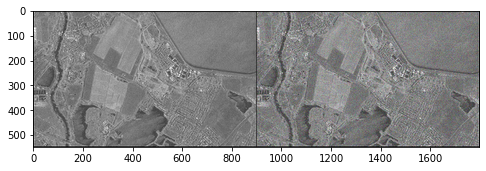

array([[[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.38039216, ..., 0.25941986,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.50980395, ..., 0.5320276 ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ]],

       [[0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.        , ..., 0.        ,
         0.        , 0.        ],
        [0.        , 0.        , 0.38039216, ..., 0.48510697,
         0.        , 0.        ],
        ...,
        [0.        , 0.        , 0.50980395, ..., 0.39675674,
         0.        , 0.        ],
        [0. 

In [8]:
# with ground truth available
img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)
plot_image_grid([img_np, img_noisy_np],4,6)

In [9]:
# when ground truth not available
# img_noisy_pil = img_pil
# img_noisy_np = img_np

In [10]:
# img_pil
# ar = np.array(img_pil)
# npImg = ar.transpose(2,0,1).astype(np.float32)/255
# img_noisy_np

In [11]:
# noise = np.random.normal(scale=sigma, size=img_np.shape)
# img_noisy_np = np.clip((img_np * noise),0,1).astype(np.float32)
# img_noisy_pil = np_to_pil(img_noisy_np)
# img_noisy_np

# plot_image_grid
# plot_image_grid([img_noisy_np],4,6)
# img_pil

In [12]:
# # from torch.cuda.random import seed
# # checking for the noise to add
# # np.log(img_np * noise)
# # img_np
# np.random.seed(42)
# noise = np.random.normal(scale=sigma_, size=img_np.shape)
# print(img_np.shape, noise.shape)
# # imgNoise = img_np + noise
# # imgNoise = np.log(img_np + np.absolute(noise))
# imgNoise = img_np + (img_np * noise)
# res = np.clip(imgNoise, 0, 1).astype(np.float32)
# plot_image_grid([res],4,6)

In [13]:
# # add noise
# img_noisy_np = get_noisy_img(img_np, sigma_)

In [14]:
# plot_image_grid([img_np, img_noisy_np], 4, 6);
# n_channels = max(x.shape[0] for x in [img_np, img_noisy_np])
# img_noisy_np.shape

# Define model

In [15]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
# OPTIMIZER='LBFGS'
show_every = 100
exp_weight=0.99

In [16]:
num_iter = 3000
input_depth = 32 
figsize = 4 

In [17]:
# returns a model
# net = get_net(input_depth, 'UNet', pad,
#               skip_n33d=128, 
#               skip_n33u=128, 
#               skip_n11=4, 
#               num_scales=5,
              # upsample_mode='bilinear').type(dtype)
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

In [18]:
# ./utils/common_utils.py
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0]), noise_type='l').type(dtype).detach()
# net_input.shape

laplacian


torch.Size([1, 32, 544, 896])

In [19]:
# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

Number of params: 2217831


In [20]:
# Loss
mse = torch.nn.MSELoss().type(dtype)
# noise to change and see
img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

# Optimize Model

In [21]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0

In [22]:
# Loss funftion printing image
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)

    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0]) 
    
    # So 'PSRN_gt', 'PSNR_gt_sm' only when ground truth is provided
    print('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), end='')

    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        
         
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

In [23]:
p = get_params(OPT_OVER, net, net_input)

Starting optimization with ADAM
Iteration 00000    Loss 0.027229   PSNR_noisy: 15.649650   PSRN_gt: 17.515230 PSNR_gt_sm: 17.515230

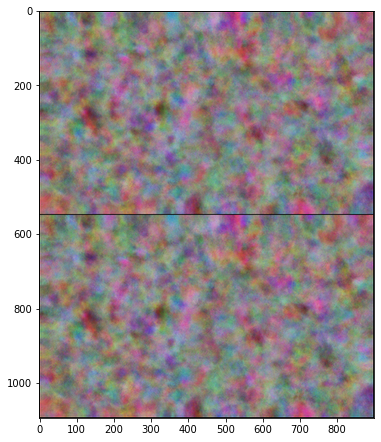

Iteration 00001    Loss 0.034530   PSNR_noisy: 14.618093   PSRN_gt: 16.017547 PSNR_gt_sm: 17.558235Iteration 00002    Loss 0.050997   PSNR_noisy: 12.924596   PSRN_gt: 13.822525 PSNR_gt_sm: 17.604471Iteration 00003    Loss 0.046274   PSNR_noisy: 13.346630   PSRN_gt: 14.345860 PSNR_gt_sm: 17.632385Iteration 00004    Loss 0.026649   PSNR_noisy: 15.743165   PSRN_gt: 17.656959 PSNR_gt_sm: 17.670661Iteration 00005    Loss 0.022122   PSNR_noisy: 16.551841   PSRN_gt: 18.987201 PSNR_gt_sm: 17.710523Iteration 00006    Loss 0.020628   PSNR_noisy: 16.855488   PSRN_gt: 19.536677 PSNR_gt_sm: 17.750788Iteration 00007    Loss 0.020235   PSNR_noisy: 16.939053   PSRN_gt: 19.694239 PSNR_gt_sm: 17.789572Iteration 00008    Loss 0.019771   PSNR_noisy: 17.039819   PSRN_gt: 19.887003 PSNR_gt_sm: 17.827970Iteration 00009    Loss 0.018918   PSNR_noisy: 17.231229   PSRN_gt: 20.263981 PSNR_gt_sm: 17.866649Iteration 00010    Loss 0.018536   PSNR_noisy: 17.319907   PSRN_gt: 20.444873 PSNR_gt_sm: 17.905969Iteration 

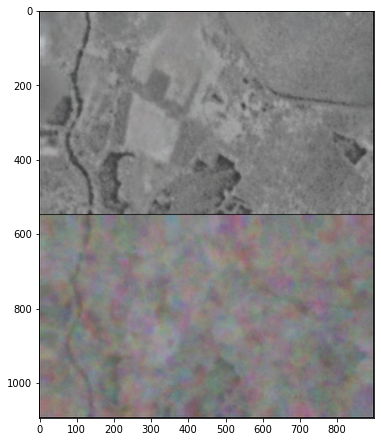

Iteration 00101    Loss 0.014990   PSNR_noisy: 18.242009   PSRN_gt: 22.585421 PSNR_gt_sm: 20.990385Iteration 00102    Loss 0.014966   PSNR_noisy: 18.248879   PSRN_gt: 22.599101 PSNR_gt_sm: 21.017374Iteration 00103    Loss 0.014938   PSNR_noisy: 18.257059   PSRN_gt: 22.622180 PSNR_gt_sm: 21.044244Iteration 00104    Loss 0.014926   PSNR_noisy: 18.260571   PSRN_gt: 22.629266 PSNR_gt_sm: 21.071050Iteration 00105    Loss 0.014913   PSNR_noisy: 18.264278   PSRN_gt: 22.640663 PSNR_gt_sm: 21.097645Iteration 00106    Loss 0.014889   PSNR_noisy: 18.271414   PSRN_gt: 22.659136 PSNR_gt_sm: 21.124299Iteration 00107    Loss 0.014872   PSNR_noisy: 18.276308   PSRN_gt: 22.670627 PSNR_gt_sm: 21.150705Iteration 00108    Loss 0.014854   PSNR_noisy: 18.281539   PSRN_gt: 22.684813 PSNR_gt_sm: 21.176639Iteration 00109    Loss 0.014850   PSNR_noisy: 18.282644   PSRN_gt: 22.687002 PSNR_gt_sm: 21.202409Iteration 00110    Loss 0.014825   PSNR_noisy: 18.289931   PSRN_gt: 22.708052 PSNR_gt_sm: 21.228262Iteration 

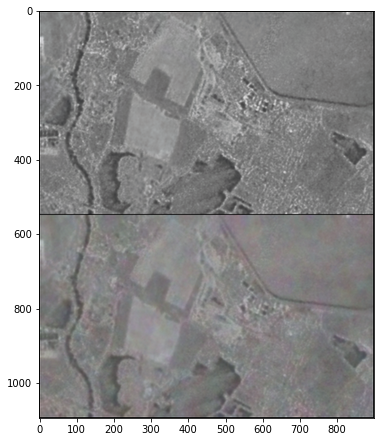

Iteration 00201    Loss 0.013884   PSNR_noisy: 18.574918   PSRN_gt: 23.434152 PSNR_gt_sm: 22.892863Iteration 00202    Loss 0.013884   PSNR_noisy: 18.574736   PSRN_gt: 23.439551 PSNR_gt_sm: 22.905050Iteration 00203    Loss 0.013884   PSNR_noisy: 18.574755   PSRN_gt: 23.432988 PSNR_gt_sm: 22.916973Iteration 00204    Loss 0.013852   PSNR_noisy: 18.584973   PSRN_gt: 23.466457 PSNR_gt_sm: 22.928860Iteration 00205    Loss 0.013844   PSNR_noisy: 18.587375   PSRN_gt: 23.469278 PSNR_gt_sm: 22.940751Iteration 00206    Loss 0.013834   PSNR_noisy: 18.590627   PSRN_gt: 23.478103 PSNR_gt_sm: 22.952574Iteration 00207    Loss 0.013834   PSNR_noisy: 18.590650   PSRN_gt: 23.479780 PSNR_gt_sm: 22.964614Iteration 00208    Loss 0.013822   PSNR_noisy: 18.594149   PSRN_gt: 23.484735 PSNR_gt_sm: 22.976367Iteration 00209    Loss 0.013814   PSNR_noisy: 18.596893   PSRN_gt: 23.497669 PSNR_gt_sm: 22.987766Iteration 00210    Loss 0.013823   PSNR_noisy: 18.594059   PSRN_gt: 23.484019 PSNR_gt_sm: 22.999188Iteration 

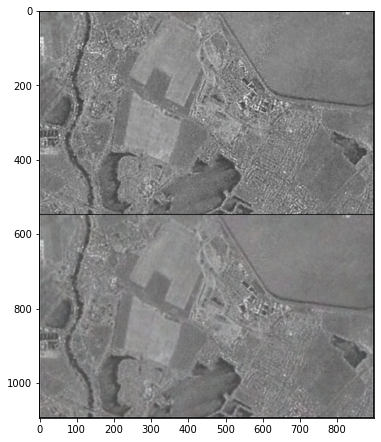

Iteration 00301    Loss 0.013204   PSNR_noisy: 18.793086   PSRN_gt: 23.981616 PSNR_gt_sm: 23.801656Iteration 00302    Loss 0.013210   PSNR_noisy: 18.791056   PSRN_gt: 23.968242 PSNR_gt_sm: 23.808968Iteration 00303    Loss 0.013212   PSNR_noisy: 18.790402   PSRN_gt: 23.957115 PSNR_gt_sm: 23.816554Iteration 00304    Loss 0.013185   PSNR_noisy: 18.799311   PSRN_gt: 23.993472 PSNR_gt_sm: 23.823802Iteration 00305    Loss 0.013185   PSNR_noisy: 18.799221   PSRN_gt: 23.997481 PSNR_gt_sm: 23.830720Iteration 00306    Loss 0.013168   PSNR_noisy: 18.804740   PSRN_gt: 24.012224 PSNR_gt_sm: 23.837916Iteration 00307    Loss 0.013161   PSNR_noisy: 18.807235   PSRN_gt: 24.013020 PSNR_gt_sm: 23.845418Iteration 00308    Loss 0.013156   PSNR_noisy: 18.808622   PSRN_gt: 24.011900 PSNR_gt_sm: 23.852673Iteration 00309    Loss 0.013156   PSNR_noisy: 18.808747   PSRN_gt: 24.017904 PSNR_gt_sm: 23.859440Iteration 00310    Loss 0.013143   PSNR_noisy: 18.813112   PSRN_gt: 24.027618 PSNR_gt_sm: 23.866377Iteration 

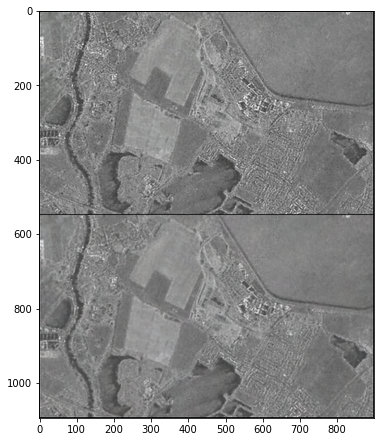

Iteration 00401    Loss 0.012631   PSNR_noisy: 18.985452   PSRN_gt: 24.414441 PSNR_gt_sm: 24.444377Iteration 00402    Loss 0.012627   PSNR_noisy: 18.986924   PSRN_gt: 24.417879 PSNR_gt_sm: 24.450013Iteration 00403    Loss 0.012625   PSNR_noisy: 18.987644   PSRN_gt: 24.421438 PSNR_gt_sm: 24.455571Iteration 00404    Loss 0.012619   PSNR_noisy: 18.989742   PSRN_gt: 24.430635 PSNR_gt_sm: 24.460968Iteration 00405    Loss 0.012624   PSNR_noisy: 18.987909   PSRN_gt: 24.413989 PSNR_gt_sm: 24.466445Iteration 00406    Loss 0.012604   PSNR_noisy: 18.994871   PSRN_gt: 24.430148 PSNR_gt_sm: 24.472012Iteration 00407    Loss 0.012599   PSNR_noisy: 18.996694   PSRN_gt: 24.430574 PSNR_gt_sm: 24.477787Iteration 00408    Loss 0.012600   PSNR_noisy: 18.996358   PSRN_gt: 24.435759 PSNR_gt_sm: 24.483271Iteration 00409    Loss 0.012589   PSNR_noisy: 19.000107   PSRN_gt: 24.453727 PSNR_gt_sm: 24.488736Iteration 00410    Loss 0.012584   PSNR_noisy: 19.001765   PSRN_gt: 24.457408 PSNR_gt_sm: 24.493823Iteration 

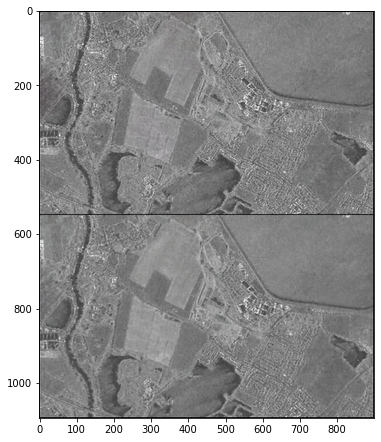

Iteration 00501    Loss 0.012361   PSNR_noisy: 19.079312   PSRN_gt: 24.533141 PSNR_gt_sm: 24.898442Iteration 00502    Loss 0.012317   PSNR_noisy: 19.094972   PSRN_gt: 24.620072 PSNR_gt_sm: 24.901646Iteration 00503    Loss 0.012263   PSNR_noisy: 19.113946   PSRN_gt: 24.655105 PSNR_gt_sm: 24.905227Iteration 00504    Loss 0.012285   PSNR_noisy: 19.106393   PSRN_gt: 24.623773 PSNR_gt_sm: 24.908666Iteration 00505    Loss 0.012267   PSNR_noisy: 19.112721   PSRN_gt: 24.666977 PSNR_gt_sm: 24.911770Iteration 00506    Loss 0.012249   PSNR_noisy: 19.118925   PSRN_gt: 24.661067 PSNR_gt_sm: 24.915342Iteration 00507    Loss 0.012270   PSNR_noisy: 19.111638   PSRN_gt: 24.648132 PSNR_gt_sm: 24.918834Iteration 00508    Loss 0.012276   PSNR_noisy: 19.109291   PSRN_gt: 24.633720 PSNR_gt_sm: 24.922053Iteration 00509    Loss 0.012243   PSNR_noisy: 19.120955   PSRN_gt: 24.657185 PSNR_gt_sm: 24.925552Iteration 00510    Loss 0.012230   PSNR_noisy: 19.125719   PSRN_gt: 24.689207 PSNR_gt_sm: 24.928789Iteration 

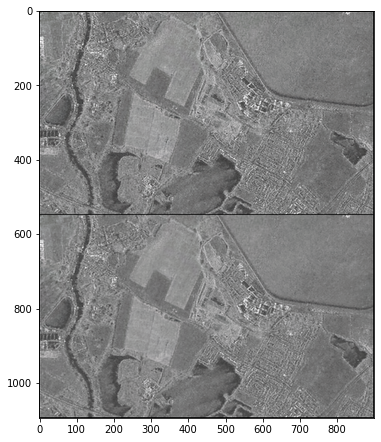

Iteration 00601    Loss 0.011982   PSNR_noisy: 19.214665   PSRN_gt: 24.822658 PSNR_gt_sm: 25.173394Iteration 00602    Loss 0.012006   PSNR_noisy: 19.206061   PSRN_gt: 24.816932 PSNR_gt_sm: 25.175491Iteration 00603    Loss 0.011979   PSNR_noisy: 19.215628   PSRN_gt: 24.830710 PSNR_gt_sm: 25.177512Iteration 00604    Loss 0.011988   PSNR_noisy: 19.212711   PSRN_gt: 24.796053 PSNR_gt_sm: 25.179698Iteration 00605    Loss 0.011970   PSNR_noisy: 19.219038   PSRN_gt: 24.825654 PSNR_gt_sm: 25.181762Iteration 00606    Loss 0.011972   PSNR_noisy: 19.218359   PSRN_gt: 24.840760 PSNR_gt_sm: 25.183829Iteration 00607    Loss 0.011967   PSNR_noisy: 19.220108   PSRN_gt: 24.827417 PSNR_gt_sm: 25.186036Iteration 00608    Loss 0.011967   PSNR_noisy: 19.219986   PSRN_gt: 24.818766 PSNR_gt_sm: 25.188151Iteration 00609    Loss 0.011980   PSNR_noisy: 19.215602   PSRN_gt: 24.813706 PSNR_gt_sm: 25.190227Iteration 00610    Loss 0.011957   PSNR_noisy: 19.223656   PSRN_gt: 24.838899 PSNR_gt_sm: 25.192387Iteration 

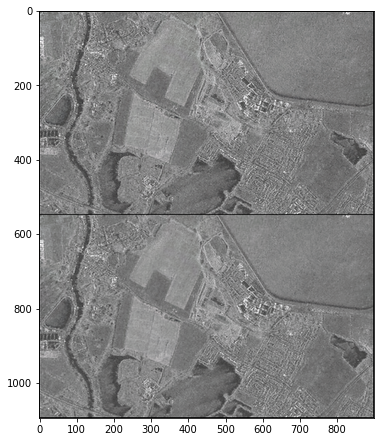

Iteration 00701    Loss 0.011774   PSNR_noisy: 19.290601   PSRN_gt: 24.906886 PSNR_gt_sm: 25.348415Iteration 00702    Loss 0.011764   PSNR_noisy: 19.294581   PSRN_gt: 24.922463 PSNR_gt_sm: 25.349950Iteration 00703    Loss 0.011756   PSNR_noisy: 19.297260   PSRN_gt: 24.914031 PSNR_gt_sm: 25.351462Iteration 00704    Loss 0.011753   PSNR_noisy: 19.298626   PSRN_gt: 24.933081 PSNR_gt_sm: 25.352960Iteration 00705    Loss 0.011759   PSNR_noisy: 19.296410   PSRN_gt: 24.944031 PSNR_gt_sm: 25.354410Iteration 00706    Loss 0.011756   PSNR_noisy: 19.297547   PSRN_gt: 24.914523 PSNR_gt_sm: 25.355892Iteration 00707    Loss 0.011745   PSNR_noisy: 19.301583   PSRN_gt: 24.909155 PSNR_gt_sm: 25.357369Iteration 00708    Loss 0.011751   PSNR_noisy: 19.299376   PSRN_gt: 24.920811 PSNR_gt_sm: 25.358859Iteration 00709    Loss 0.011747   PSNR_noisy: 19.300739   PSRN_gt: 24.933079 PSNR_gt_sm: 25.360331Iteration 00710    Loss 0.011744   PSNR_noisy: 19.301693   PSRN_gt: 24.929698 PSNR_gt_sm: 25.361865Iteration 

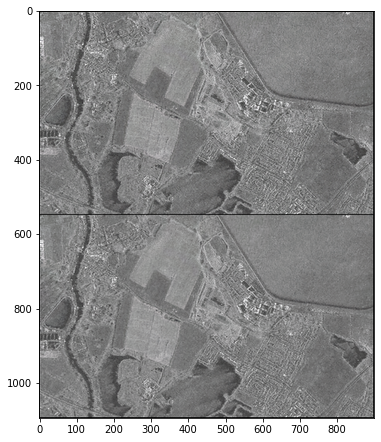

Iteration 00801    Loss 0.011628   PSNR_noisy: 19.345093   PSRN_gt: 24.940560 PSNR_gt_sm: 25.485028Iteration 00802    Loss 0.011618   PSNR_noisy: 19.348546   PSRN_gt: 24.932955 PSNR_gt_sm: 25.486490Iteration 00803    Loss 0.011616   PSNR_noisy: 19.349578   PSRN_gt: 24.939159 PSNR_gt_sm: 25.487772Iteration 00804    Loss 0.011590   PSNR_noisy: 19.359304   PSRN_gt: 24.963728 PSNR_gt_sm: 25.489147Iteration 00805    Loss 0.011573   PSNR_noisy: 19.365669   PSRN_gt: 25.016303 PSNR_gt_sm: 25.490524Iteration 00806    Loss 0.011574   PSNR_noisy: 19.365079   PSRN_gt: 24.996962 PSNR_gt_sm: 25.491789Iteration 00807    Loss 0.011579   PSNR_noisy: 19.363302   PSRN_gt: 24.932762 PSNR_gt_sm: 25.493099Iteration 00808    Loss 0.011585   PSNR_noisy: 19.360860   PSRN_gt: 24.977771 PSNR_gt_sm: 25.494374Iteration 00809    Loss 0.011607   PSNR_noisy: 19.352787   PSRN_gt: 24.963715 PSNR_gt_sm: 25.495767Iteration 00810    Loss 0.011605   PSNR_noisy: 19.353687   PSRN_gt: 24.909239 PSNR_gt_sm: 25.497117Iteration 

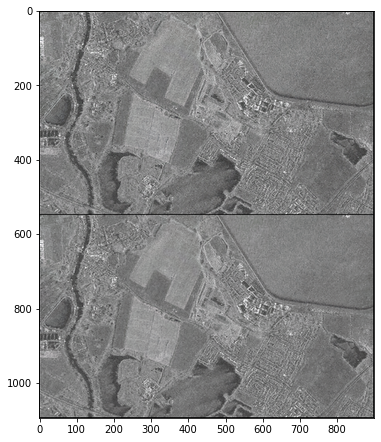

Iteration 00901    Loss 0.011395   PSNR_noisy: 19.432817   PSRN_gt: 25.049683 PSNR_gt_sm: 25.610377Iteration 00902    Loss 0.011393   PSNR_noisy: 19.433513   PSRN_gt: 25.058889 PSNR_gt_sm: 25.611422Iteration 00903    Loss 0.011397   PSNR_noisy: 19.432035   PSRN_gt: 25.055366 PSNR_gt_sm: 25.612560Iteration 00904    Loss 0.011399   PSNR_noisy: 19.431202   PSRN_gt: 25.054340 PSNR_gt_sm: 25.613722Iteration 00905    Loss 0.011382   PSNR_noisy: 19.438000   PSRN_gt: 25.083798 PSNR_gt_sm: 25.615044Iteration 00906    Loss 0.011377   PSNR_noisy: 19.439608   PSRN_gt: 25.076184 PSNR_gt_sm: 25.616311Iteration 00907    Loss 0.011384   PSNR_noisy: 19.436932   PSRN_gt: 25.016461 PSNR_gt_sm: 25.617397Iteration 00908    Loss 0.011391   PSNR_noisy: 19.434423   PSRN_gt: 25.033596 PSNR_gt_sm: 25.618582Iteration 00909    Loss 0.011377   PSNR_noisy: 19.439896   PSRN_gt: 25.091963 PSNR_gt_sm: 25.619855Iteration 00910    Loss 0.011376   PSNR_noisy: 19.439944   PSRN_gt: 25.059261 PSNR_gt_sm: 25.621142Iteration 

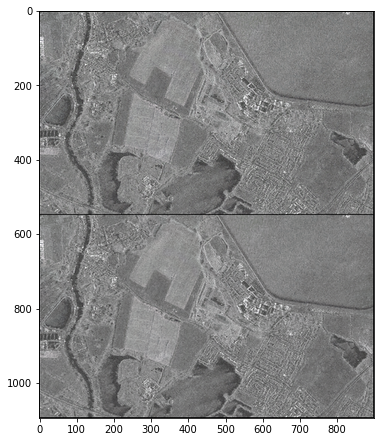

Iteration 01001    Loss 0.011191   PSNR_noisy: 19.511118   PSRN_gt: 25.127286 PSNR_gt_sm: 25.733837Iteration 01002    Loss 0.011185   PSNR_noisy: 19.513549   PSRN_gt: 25.131959 PSNR_gt_sm: 25.735141Iteration 01003    Loss 0.011197   PSNR_noisy: 19.509068   PSRN_gt: 25.094425 PSNR_gt_sm: 25.736279Iteration 01004    Loss 0.011221   PSNR_noisy: 19.499830   PSRN_gt: 25.038783 PSNR_gt_sm: 25.737381Iteration 01005    Loss 0.011218   PSNR_noisy: 19.500891   PSRN_gt: 25.107461 PSNR_gt_sm: 25.738685Iteration 01006    Loss 0.011200   PSNR_noisy: 19.507801   PSRN_gt: 25.075500 PSNR_gt_sm: 25.739912Iteration 01007    Loss 0.011187   PSNR_noisy: 19.512969   PSRN_gt: 25.125195 PSNR_gt_sm: 25.741224Iteration 01008    Loss 0.011186   PSNR_noisy: 19.513279   PSRN_gt: 25.125786 PSNR_gt_sm: 25.742472Iteration 01009    Loss 0.011182   PSNR_noisy: 19.514771   PSRN_gt: 25.096007 PSNR_gt_sm: 25.743550Iteration 01010    Loss 0.011182   PSNR_noisy: 19.514632   PSRN_gt: 25.116849 PSNR_gt_sm: 25.744785Iteration 

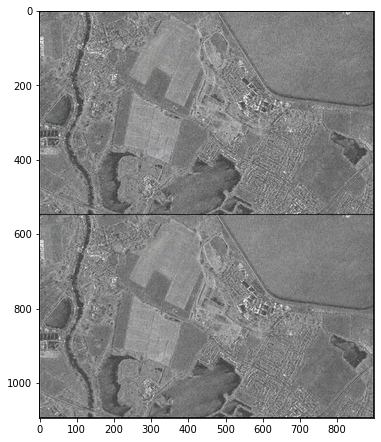

Iteration 01101    Loss 0.011051   PSNR_noisy: 19.566123   PSRN_gt: 25.163472 PSNR_gt_sm: 25.832902Iteration 01102    Loss 0.011049   PSNR_noisy: 19.566887   PSRN_gt: 25.115453 PSNR_gt_sm: 25.833911Iteration 01103    Loss 0.011047   PSNR_noisy: 19.567399   PSRN_gt: 25.132886 PSNR_gt_sm: 25.834996Iteration 01104    Loss 0.011040   PSNR_noisy: 19.570353   PSRN_gt: 25.119561 PSNR_gt_sm: 25.836062Iteration 01105    Loss 0.011038   PSNR_noisy: 19.571051   PSRN_gt: 25.154795 PSNR_gt_sm: 25.837232Iteration 01106    Loss 0.011033   PSNR_noisy: 19.573137   PSRN_gt: 25.157889 PSNR_gt_sm: 25.838387Iteration 01107    Loss 0.011020   PSNR_noisy: 19.578137   PSRN_gt: 25.157386 PSNR_gt_sm: 25.839482Iteration 01108    Loss 0.011015   PSNR_noisy: 19.580033   PSRN_gt: 25.158907 PSNR_gt_sm: 25.840542Iteration 01109    Loss 0.011023   PSNR_noisy: 19.576982   PSRN_gt: 25.135615 PSNR_gt_sm: 25.841646Iteration 01110    Loss 0.011041   PSNR_noisy: 19.570013   PSRN_gt: 25.134138 PSNR_gt_sm: 25.842703Iteration 

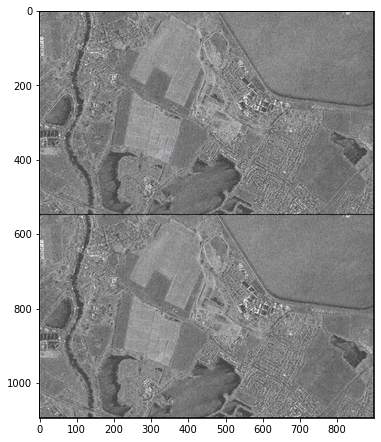

Iteration 01201    Loss 0.011016   PSNR_noisy: 19.579770   PSRN_gt: 24.964223 PSNR_gt_sm: 25.932607Iteration 01202    Loss 0.011163   PSNR_noisy: 19.522374   PSRN_gt: 24.772547 PSNR_gt_sm: 25.933365Iteration 01203    Loss 0.011277   PSNR_noisy: 19.478119   PSRN_gt: 24.679039 PSNR_gt_sm: 25.934373Iteration 01204    Loss 0.011130   PSNR_noisy: 19.535088   PSRN_gt: 24.922010 PSNR_gt_sm: 25.935560Iteration 01205    Loss 0.010922   PSNR_noisy: 19.616952   PSRN_gt: 25.168852 PSNR_gt_sm: 25.936456Iteration 01206    Loss 0.011056   PSNR_noisy: 19.564076   PSRN_gt: 24.992625 PSNR_gt_sm: 25.937329Iteration 01207    Loss 0.011034   PSNR_noisy: 19.572866   PSRN_gt: 25.052572 PSNR_gt_sm: 25.938285Iteration 01208    Loss 0.010900   PSNR_noisy: 19.625692   PSRN_gt: 25.198371 PSNR_gt_sm: 25.938966Iteration 01209    Loss 0.011038   PSNR_noisy: 19.571194   PSRN_gt: 24.974684 PSNR_gt_sm: 25.939712Iteration 01210    Loss 0.010971   PSNR_noisy: 19.597602   PSRN_gt: 25.083549 PSNR_gt_sm: 25.940482Iteration 

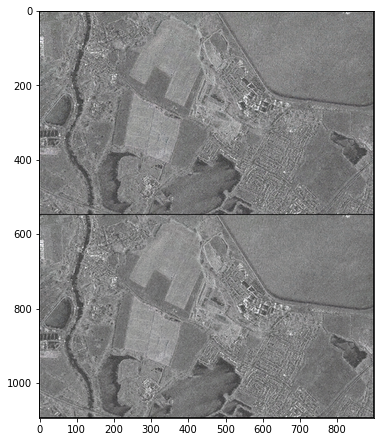

Iteration 01301    Loss 0.010753   PSNR_noisy: 19.684778   PSRN_gt: 25.079572 PSNR_gt_sm: 26.013298Iteration 01302    Loss 0.010719   PSNR_noisy: 19.698629   PSRN_gt: 25.197801 PSNR_gt_sm: 26.014189Iteration 01303    Loss 0.010714   PSNR_noisy: 19.700594   PSRN_gt: 25.182620 PSNR_gt_sm: 26.014975Iteration 01304    Loss 0.010726   PSNR_noisy: 19.695562   PSRN_gt: 25.106258 PSNR_gt_sm: 26.015495Iteration 01305    Loss 0.010753   PSNR_noisy: 19.684606   PSRN_gt: 25.163517 PSNR_gt_sm: 26.016399Iteration 01306    Loss 0.010743   PSNR_noisy: 19.688622   PSRN_gt: 25.095896 PSNR_gt_sm: 26.017164Iteration 01307    Loss 0.010708   PSNR_noisy: 19.703100   PSRN_gt: 25.196761 PSNR_gt_sm: 26.018094Iteration 01308    Loss 0.010701   PSNR_noisy: 19.705920   PSRN_gt: 25.195560 PSNR_gt_sm: 26.018888Iteration 01309    Loss 0.010709   PSNR_noisy: 19.702421   PSRN_gt: 25.108282 PSNR_gt_sm: 26.019375Iteration 01310    Loss 0.010725   PSNR_noisy: 19.695897   PSRN_gt: 25.197666 PSNR_gt_sm: 26.020276Iteration 

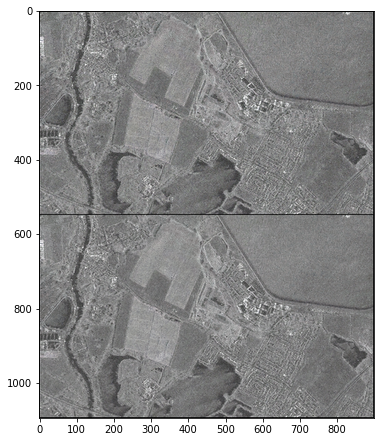

Iteration 01401    Loss 0.010576   PSNR_noisy: 19.756900   PSRN_gt: 25.130632 PSNR_gt_sm: 26.080256Iteration 01402    Loss 0.010566   PSNR_noisy: 19.760922   PSRN_gt: 25.171642 PSNR_gt_sm: 26.080924Iteration 01403    Loss 0.010575   PSNR_noisy: 19.757258   PSRN_gt: 25.101672 PSNR_gt_sm: 26.081408Iteration 01404    Loss 0.010562   PSNR_noisy: 19.762486   PSRN_gt: 25.196886 PSNR_gt_sm: 26.082206Iteration 01405    Loss 0.010549   PSNR_noisy: 19.767761   PSRN_gt: 25.141643 PSNR_gt_sm: 26.082773Iteration 01406    Loss 0.010542   PSNR_noisy: 19.770613   PSRN_gt: 25.197279 PSNR_gt_sm: 26.083333Iteration 01407    Loss 0.010558   PSNR_noisy: 19.764264   PSRN_gt: 25.129061 PSNR_gt_sm: 26.083786Iteration 01408    Loss 0.010603   PSNR_noisy: 19.745749   PSRN_gt: 25.044151 PSNR_gt_sm: 26.084102Iteration 01409    Loss 0.010675   PSNR_noisy: 19.716262   PSRN_gt: 25.009027 PSNR_gt_sm: 26.084720Iteration 01410    Loss 0.010731   PSNR_noisy: 19.693701   PSRN_gt: 24.948511 PSNR_gt_sm: 26.085403Iteration 

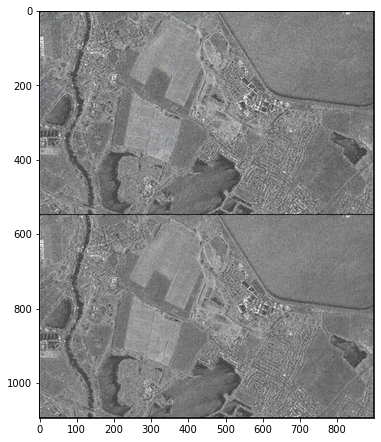

Iteration 01501    Loss 0.010454   PSNR_noisy: 19.806984   PSRN_gt: 25.167561 PSNR_gt_sm: 26.132547Iteration 01502    Loss 0.010429   PSNR_noisy: 19.817419   PSRN_gt: 25.167359 PSNR_gt_sm: 26.132837Iteration 01503    Loss 0.010430   PSNR_noisy: 19.817158   PSRN_gt: 25.175964 PSNR_gt_sm: 26.133414Iteration 01504    Loss 0.010428   PSNR_noisy: 19.817802   PSRN_gt: 25.208323 PSNR_gt_sm: 26.134009Iteration 01505    Loss 0.010407   PSNR_noisy: 19.826795   PSRN_gt: 25.151511 PSNR_gt_sm: 26.134240Iteration 01506    Loss 0.010425   PSNR_noisy: 19.819206   PSRN_gt: 25.093753 PSNR_gt_sm: 26.134385Iteration 01507    Loss 0.010419   PSNR_noisy: 19.821733   PSRN_gt: 25.211701 PSNR_gt_sm: 26.134954Iteration 01508    Loss 0.010409   PSNR_noisy: 19.826048   PSRN_gt: 25.106121 PSNR_gt_sm: 26.134899Iteration 01509    Loss 0.010413   PSNR_noisy: 19.824330   PSRN_gt: 25.129828 PSNR_gt_sm: 26.135247Iteration 01510    Loss 0.010426   PSNR_noisy: 19.818818   PSRN_gt: 25.178910 PSNR_gt_sm: 26.135907Iteration 

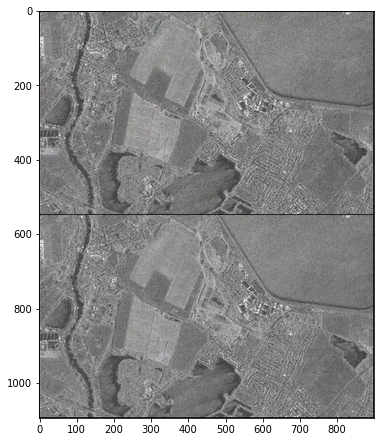

Iteration 01601    Loss 0.010272   PSNR_noisy: 19.883488   PSRN_gt: 25.145308 PSNR_gt_sm: 26.168619Iteration 01602    Loss 0.010268   PSNR_noisy: 19.885318   PSRN_gt: 25.185496 PSNR_gt_sm: 26.169119Iteration 01603    Loss 0.010289   PSNR_noisy: 19.876058   PSRN_gt: 25.054893 PSNR_gt_sm: 26.169152Iteration 01604    Loss 0.010324   PSNR_noisy: 19.861624   PSRN_gt: 25.068963 PSNR_gt_sm: 26.169461Iteration 01605    Loss 0.010331   PSNR_noisy: 19.858379   PSRN_gt: 25.028592 PSNR_gt_sm: 26.169626Iteration 01606    Loss 0.010295   PSNR_noisy: 19.873635   PSRN_gt: 25.088897 PSNR_gt_sm: 26.169849Iteration 01607    Loss 0.010280   PSNR_noisy: 19.879881   PSRN_gt: 25.131241 PSNR_gt_sm: 26.170211Iteration 01608    Loss 0.010296   PSNR_noisy: 19.873293   PSRN_gt: 25.020958 PSNR_gt_sm: 26.170205Iteration 01609    Loss 0.010294   PSNR_noisy: 19.874252   PSRN_gt: 25.154620 PSNR_gt_sm: 26.170750Iteration 01610    Loss 0.010266   PSNR_noisy: 19.886177   PSRN_gt: 25.061311 PSNR_gt_sm: 26.170716Iteration 

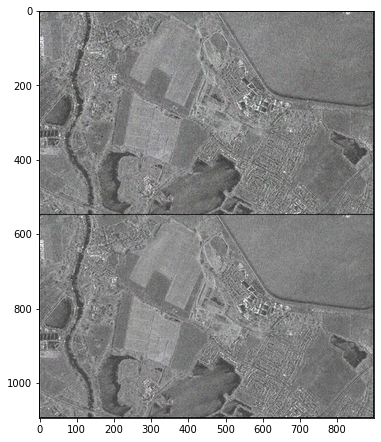

Iteration 01701    Loss 0.010231   PSNR_noisy: 19.900674   PSRN_gt: 24.941738 PSNR_gt_sm: 26.191269Iteration 01702    Loss 0.010315   PSNR_noisy: 19.865372   PSRN_gt: 24.812298 PSNR_gt_sm: 26.191114Iteration 01703    Loss 0.010394   PSNR_noisy: 19.832267   PSRN_gt: 24.819550 PSNR_gt_sm: 26.191651Iteration 01704    Loss 0.010419   PSNR_noisy: 19.821662   PSRN_gt: 24.794114 PSNR_gt_sm: 26.192094Iteration 01705    Loss 0.010368   PSNR_noisy: 19.843158   PSRN_gt: 24.778519 PSNR_gt_sm: 26.192039Iteration 01706    Loss 0.010298   PSNR_noisy: 19.872635   PSRN_gt: 25.137494 PSNR_gt_sm: 26.193515Iteration 01707    Loss 0.010270   PSNR_noisy: 19.884490   PSRN_gt: 24.898031 PSNR_gt_sm: 26.193195Iteration 01708    Loss 0.010256   PSNR_noisy: 19.890076   PSRN_gt: 25.043527 PSNR_gt_sm: 26.193609Iteration 01709    Loss 0.010281   PSNR_noisy: 19.879729   PSRN_gt: 25.084690 PSNR_gt_sm: 26.194712Iteration 01710    Loss 0.010226   PSNR_noisy: 19.902933   PSRN_gt: 24.935485 PSNR_gt_sm: 26.194292Iteration 

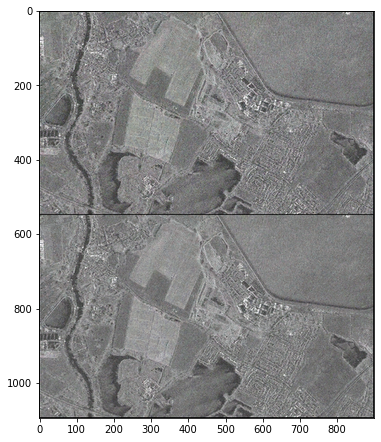

Iteration 01801    Loss 0.010029   PSNR_noisy: 19.987212   PSRN_gt: 25.063399 PSNR_gt_sm: 26.200484Iteration 01802    Loss 0.010013   PSNR_noisy: 19.994429   PSRN_gt: 24.939525 PSNR_gt_sm: 26.199884Iteration 01803    Loss 0.010005   PSNR_noisy: 19.997869   PSRN_gt: 25.082577 PSNR_gt_sm: 26.199984Iteration 01804    Loss 0.009993   PSNR_noisy: 20.003148   PSRN_gt: 25.041578 PSNR_gt_sm: 26.199898Iteration 01805    Loss 0.010000   PSNR_noisy: 19.999819   PSRN_gt: 25.046222 PSNR_gt_sm: 26.199940Iteration 01806    Loss 0.009983   PSNR_noisy: 20.007188   PSRN_gt: 25.071961 PSNR_gt_sm: 26.200096Iteration 01807    Loss 0.009972   PSNR_noisy: 20.012119   PSRN_gt: 25.004071 PSNR_gt_sm: 26.199714Iteration 01808    Loss 0.009972   PSNR_noisy: 20.012118   PSRN_gt: 25.019440 PSNR_gt_sm: 26.199413Iteration 01809    Loss 0.009991   PSNR_noisy: 20.004012   PSRN_gt: 24.983833 PSNR_gt_sm: 26.199124Iteration 01810    Loss 0.010015   PSNR_noisy: 19.993510   PSRN_gt: 25.029497 PSNR_gt_sm: 26.199293Iteration 

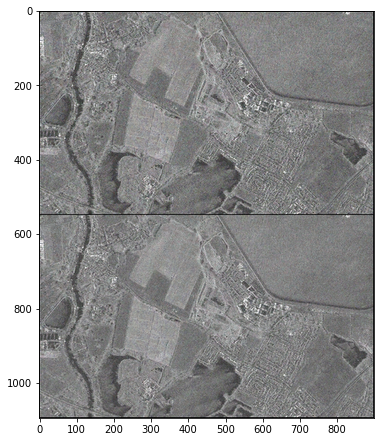

Iteration 01901    Loss 0.009920   PSNR_noisy: 20.035049   PSRN_gt: 24.953452 PSNR_gt_sm: 26.192206Iteration 01902    Loss 0.009931   PSNR_noisy: 20.030267   PSRN_gt: 24.819825 PSNR_gt_sm: 26.191575Iteration 01903    Loss 0.009878   PSNR_noisy: 20.053443   PSRN_gt: 25.058340 PSNR_gt_sm: 26.192092Iteration 01904    Loss 0.009875   PSNR_noisy: 20.054799   PSRN_gt: 24.912206 PSNR_gt_sm: 26.191628Iteration 01905    Loss 0.009932   PSNR_noisy: 20.029708   PSRN_gt: 24.930963 PSNR_gt_sm: 26.191793Iteration 01906    Loss 0.009931   PSNR_noisy: 20.030039   PSRN_gt: 24.873904 PSNR_gt_sm: 26.191516Iteration 01907    Loss 0.009960   PSNR_noisy: 20.017589   PSRN_gt: 24.908119 PSNR_gt_sm: 26.191744Iteration 01908    Loss 0.010021   PSNR_noisy: 19.990831   PSRN_gt: 24.681736 PSNR_gt_sm: 26.191068Iteration 01909    Loss 0.010020   PSNR_noisy: 19.991350   PSRN_gt: 24.950796 PSNR_gt_sm: 26.191783Iteration 01910    Loss 0.009974   PSNR_noisy: 20.011120   PSRN_gt: 24.807284 PSNR_gt_sm: 26.191499Iteration 

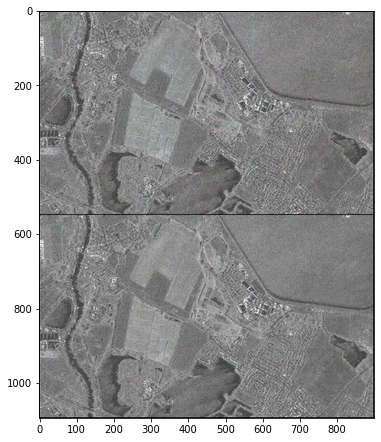

Iteration 02001    Loss 0.009762   PSNR_noisy: 20.104494   PSRN_gt: 24.848751 PSNR_gt_sm: 26.174098Iteration 02002    Loss 0.009768   PSNR_noisy: 20.101859   PSRN_gt: 24.873980 PSNR_gt_sm: 26.173819Iteration 02003    Loss 0.009796   PSNR_noisy: 20.089380   PSRN_gt: 24.952262 PSNR_gt_sm: 26.174216Iteration 02004    Loss 0.009803   PSNR_noisy: 20.086533   PSRN_gt: 24.744185 PSNR_gt_sm: 26.173320Iteration 02005    Loss 0.009779   PSNR_noisy: 20.097244   PSRN_gt: 24.818547 PSNR_gt_sm: 26.172630Iteration 02006    Loss 0.009791   PSNR_noisy: 20.091509   PSRN_gt: 24.885499 PSNR_gt_sm: 26.172489Iteration 02007    Loss 0.009808   PSNR_noisy: 20.084080   PSRN_gt: 24.874660 PSNR_gt_sm: 26.172587Iteration 02008    Loss 0.009867   PSNR_noisy: 20.058310   PSRN_gt: 24.758601 PSNR_gt_sm: 26.172376Iteration 02009    Loss 0.009931   PSNR_noisy: 20.030116   PSRN_gt: 24.718809 PSNR_gt_sm: 26.172440Iteration 02010    Loss 0.009847   PSNR_noisy: 20.066901   PSRN_gt: 24.942904 PSNR_gt_sm: 26.173072Iteration 

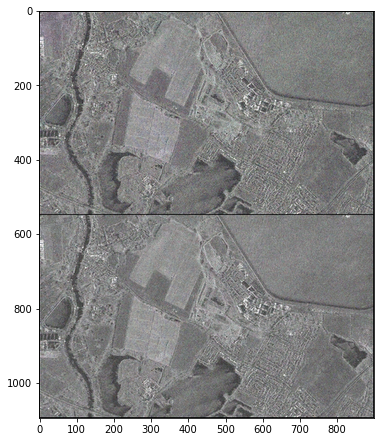

Iteration 02101    Loss 0.009640   PSNR_noisy: 20.159025   PSRN_gt: 24.889362 PSNR_gt_sm: 26.157030Iteration 02102    Loss 0.009627   PSNR_noisy: 20.165307   PSRN_gt: 24.859894 PSNR_gt_sm: 26.156552Iteration 02103    Loss 0.009608   PSNR_noisy: 20.173890   PSRN_gt: 24.888694 PSNR_gt_sm: 26.156045Iteration 02104    Loss 0.009616   PSNR_noisy: 20.169891   PSRN_gt: 24.856752 PSNR_gt_sm: 26.155408Iteration 02105    Loss 0.009609   PSNR_noisy: 20.173301   PSRN_gt: 24.858552 PSNR_gt_sm: 26.154826Iteration 02106    Loss 0.009595   PSNR_noisy: 20.179747   PSRN_gt: 24.894584 PSNR_gt_sm: 26.154449Iteration 02107    Loss 0.009614   PSNR_noisy: 20.171160   PSRN_gt: 24.848407 PSNR_gt_sm: 26.154015Iteration 02108    Loss 0.009618   PSNR_noisy: 20.169301   PSRN_gt: 24.890740 PSNR_gt_sm: 26.153789Iteration 02109    Loss 0.009611   PSNR_noisy: 20.172481   PSRN_gt: 24.799534 PSNR_gt_sm: 26.152906Iteration 02110    Loss 0.009615   PSNR_noisy: 20.170430   PSRN_gt: 24.901911 PSNR_gt_sm: 26.152768Iteration 

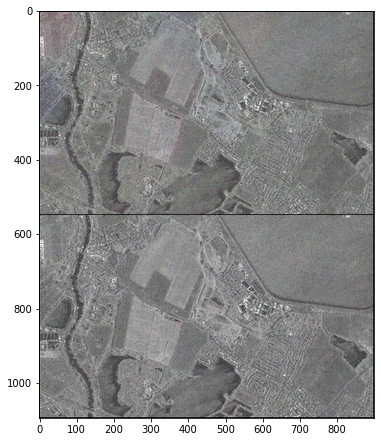

Iteration 02201    Loss 0.009657   PSNR_noisy: 20.151715   PSRN_gt: 24.578330 PSNR_gt_sm: 26.116136Iteration 02202    Loss 0.009649   PSNR_noisy: 20.155074   PSRN_gt: 24.747446 PSNR_gt_sm: 26.116341Iteration 02203    Loss 0.009642   PSNR_noisy: 20.158393   PSRN_gt: 24.768111 PSNR_gt_sm: 26.116470Iteration 02204    Loss 0.009587   PSNR_noisy: 20.183197   PSRN_gt: 24.779564 PSNR_gt_sm: 26.116344Iteration 02205    Loss 0.009620   PSNR_noisy: 20.168421   PSRN_gt: 24.832580 PSNR_gt_sm: 26.117073Iteration 02206    Loss 0.009551   PSNR_noisy: 20.199482   PSRN_gt: 24.806779 PSNR_gt_sm: 26.116819Iteration 02207    Loss 0.009559   PSNR_noisy: 20.195723   PSRN_gt: 24.770374 PSNR_gt_sm: 26.116444Iteration 02208    Loss 0.009565   PSNR_noisy: 20.193356   PSRN_gt: 24.834110 PSNR_gt_sm: 26.116668Iteration 02209    Loss 0.009528   PSNR_noisy: 20.209914   PSRN_gt: 24.749890 PSNR_gt_sm: 26.115899Iteration 02210    Loss 0.009534   PSNR_noisy: 20.207129   PSRN_gt: 24.816361 PSNR_gt_sm: 26.115744Iteration 

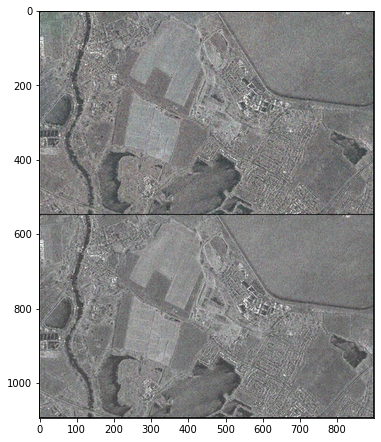

Iteration 02301    Loss 0.009498   PSNR_noisy: 20.223472   PSRN_gt: 24.768077 PSNR_gt_sm: 26.080433Iteration 02302    Loss 0.009513   PSNR_noisy: 20.216667   PSRN_gt: 24.626145 PSNR_gt_sm: 26.079879Iteration 02303    Loss 0.009476   PSNR_noisy: 20.233606   PSRN_gt: 24.775155 PSNR_gt_sm: 26.079903Iteration 02304    Loss 0.009457   PSNR_noisy: 20.242314   PSRN_gt: 24.769693 PSNR_gt_sm: 26.079831Iteration 02305    Loss 0.009460   PSNR_noisy: 20.240990   PSRN_gt: 24.696050 PSNR_gt_sm: 26.079273Iteration 02306    Loss 0.009428   PSNR_noisy: 20.255861   PSRN_gt: 24.757962 PSNR_gt_sm: 26.079135Iteration 02307    Loss 0.009403   PSNR_noisy: 20.267513   PSRN_gt: 24.793373 PSNR_gt_sm: 26.078990Iteration 02308    Loss 0.009418   PSNR_noisy: 20.260630   PSRN_gt: 24.670747 PSNR_gt_sm: 26.077985Iteration 02309    Loss 0.009401   PSNR_noisy: 20.268174   PSRN_gt: 24.746942 PSNR_gt_sm: 26.077538Iteration 02310    Loss 0.009390   PSNR_noisy: 20.273444   PSRN_gt: 24.729172 PSNR_gt_sm: 26.076845Iteration 

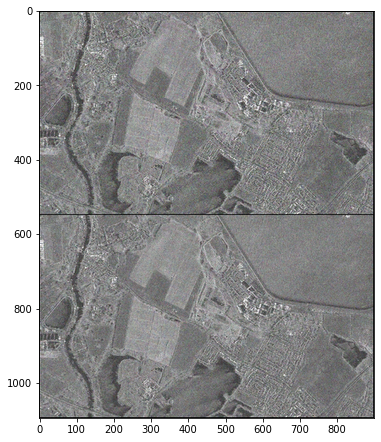

Iteration 02401    Loss 0.009240   PSNR_noisy: 20.343478   PSRN_gt: 24.712357 PSNR_gt_sm: 26.028574Iteration 02402    Loss 0.009245   PSNR_noisy: 20.341106   PSRN_gt: 24.616127 PSNR_gt_sm: 26.027421Iteration 02403    Loss 0.009241   PSNR_noisy: 20.342740   PSRN_gt: 24.632867 PSNR_gt_sm: 26.026497Iteration 02404    Loss 0.009246   PSNR_noisy: 20.340682   PSRN_gt: 24.623232 PSNR_gt_sm: 26.025470Iteration 02405    Loss 0.009260   PSNR_noisy: 20.333823   PSRN_gt: 24.550088 PSNR_gt_sm: 26.024225Iteration 02406    Loss 0.009297   PSNR_noisy: 20.316627   PSRN_gt: 24.613002 PSNR_gt_sm: 26.023599Iteration 02407    Loss 0.009307   PSNR_noisy: 20.311941   PSRN_gt: 24.482839 PSNR_gt_sm: 26.022269Iteration 02408    Loss 0.009337   PSNR_noisy: 20.298114   PSRN_gt: 24.558562 PSNR_gt_sm: 26.021803Iteration 02409    Loss 0.009384   PSNR_noisy: 20.276121   PSRN_gt: 24.519801 PSNR_gt_sm: 26.021348Iteration 02410    Loss 0.009463   PSNR_noisy: 20.239865   PSRN_gt: 24.359180 PSNR_gt_sm: 26.020593Iteration 

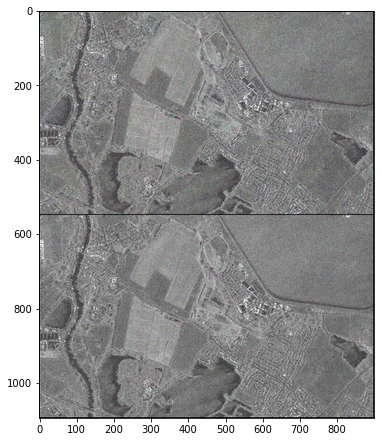

Iteration 02501    Loss 0.009200   PSNR_noisy: 20.362355   PSRN_gt: 24.532089 PSNR_gt_sm: 25.980712Iteration 02502    Loss 0.009192   PSNR_noisy: 20.366122   PSRN_gt: 24.541941 PSNR_gt_sm: 25.979994Iteration 02503    Loss 0.009165   PSNR_noisy: 20.378846   PSRN_gt: 24.561525 PSNR_gt_sm: 25.979120Iteration 02504    Loss 0.009171   PSNR_noisy: 20.375716   PSRN_gt: 24.564679 PSNR_gt_sm: 25.978373Iteration 02505    Loss 0.009143   PSNR_noisy: 20.389275   PSRN_gt: 24.599092 PSNR_gt_sm: 25.977760Iteration 02506    Loss 0.009139   PSNR_noisy: 20.391016   PSRN_gt: 24.565322 PSNR_gt_sm: 25.976871Iteration 02507    Loss 0.009117   PSNR_noisy: 20.401426   PSRN_gt: 24.581957 PSNR_gt_sm: 25.975885Iteration 02508    Loss 0.009123   PSNR_noisy: 20.398439   PSRN_gt: 24.594370 PSNR_gt_sm: 25.975221Iteration 02509    Loss 0.009139   PSNR_noisy: 20.391066   PSRN_gt: 24.516126 PSNR_gt_sm: 25.974066Iteration 02510    Loss 0.009138   PSNR_noisy: 20.391692   PSRN_gt: 24.578366 PSNR_gt_sm: 25.973302Iteration 

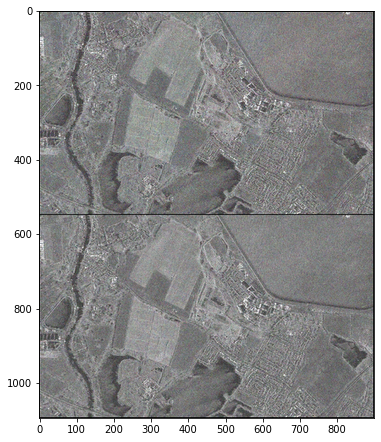

Iteration 02601    Loss 0.009083   PSNR_noisy: 20.417742   PSRN_gt: 24.367465 PSNR_gt_sm: 25.916218Iteration 02602    Loss 0.009057   PSNR_noisy: 20.430339   PSRN_gt: 24.500255 PSNR_gt_sm: 25.915650Iteration 02603    Loss 0.009053   PSNR_noisy: 20.432296   PSRN_gt: 24.436288 PSNR_gt_sm: 25.914413Iteration 02604    Loss 0.009042   PSNR_noisy: 20.437573   PSRN_gt: 24.509255 PSNR_gt_sm: 25.913788Iteration 02605    Loss 0.009047   PSNR_noisy: 20.435116   PSRN_gt: 24.498602 PSNR_gt_sm: 25.913137Iteration 02606    Loss 0.009026   PSNR_noisy: 20.445007   PSRN_gt: 24.453080 PSNR_gt_sm: 25.912000Iteration 02607    Loss 0.009035   PSNR_noisy: 20.440729   PSRN_gt: 24.484667 PSNR_gt_sm: 25.911207Iteration 02608    Loss 0.009042   PSNR_noisy: 20.437276   PSRN_gt: 24.485326 PSNR_gt_sm: 25.910410Iteration 02609    Loss 0.009055   PSNR_noisy: 20.431154   PSRN_gt: 24.388448 PSNR_gt_sm: 25.909314Iteration 02610    Loss 0.009067   PSNR_noisy: 20.425152   PSRN_gt: 24.465123 PSNR_gt_sm: 25.908709Iteration 

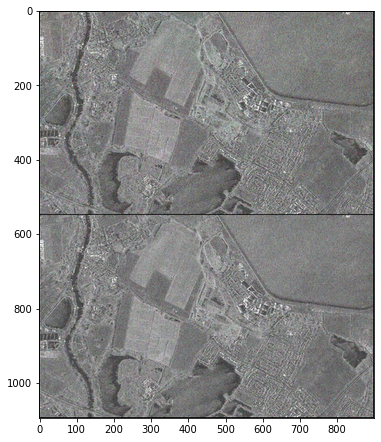

Iteration 02701    Loss 0.008909   PSNR_noisy: 20.501473   PSRN_gt: 24.373321 PSNR_gt_sm: 25.862218Iteration 02702    Loss 0.008897   PSNR_noisy: 20.507558   PSRN_gt: 24.415171 PSNR_gt_sm: 25.861136Iteration 02703    Loss 0.008902   PSNR_noisy: 20.505196   PSRN_gt: 24.442338 PSNR_gt_sm: 25.860182Iteration 02704    Loss 0.008902   PSNR_noisy: 20.505272   PSRN_gt: 24.429578 PSNR_gt_sm: 25.859332Iteration 02705    Loss 0.008920   PSNR_noisy: 20.496134   PSRN_gt: 24.328404 PSNR_gt_sm: 25.857842Iteration 02706    Loss 0.008961   PSNR_noisy: 20.476214   PSRN_gt: 24.371863 PSNR_gt_sm: 25.857072Iteration 02707    Loss 0.009019   PSNR_noisy: 20.448311   PSRN_gt: 24.275366 PSNR_gt_sm: 25.856199Iteration 02708    Loss 0.009108   PSNR_noisy: 20.405716   PSRN_gt: 24.178879 PSNR_gt_sm: 25.855239Iteration 02709    Loss 0.009133   PSNR_noisy: 20.393918   PSRN_gt: 24.244268 PSNR_gt_sm: 25.855011Iteration 02710    Loss 0.009037   PSNR_noisy: 20.439551   PSRN_gt: 24.295753 PSNR_gt_sm: 25.854260Iteration 

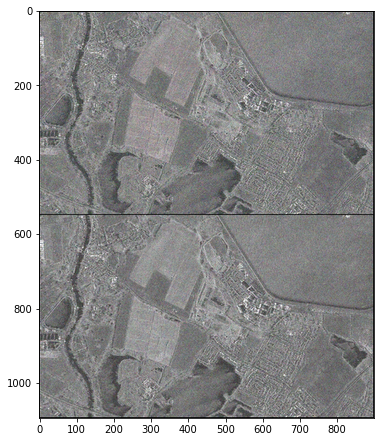

Iteration 02801    Loss 0.008868   PSNR_noisy: 20.521829   PSRN_gt: 24.177786 PSNR_gt_sm: 25.786748Iteration 02802    Loss 0.008833   PSNR_noisy: 20.539011   PSRN_gt: 24.408519 PSNR_gt_sm: 25.786696Iteration 02803    Loss 0.008873   PSNR_noisy: 20.519357   PSRN_gt: 24.307611 PSNR_gt_sm: 25.786168Iteration 02804    Loss 0.008881   PSNR_noisy: 20.515432   PSRN_gt: 24.107473 PSNR_gt_sm: 25.784275Iteration 02805    Loss 0.008893   PSNR_noisy: 20.509567   PSRN_gt: 24.409629 PSNR_gt_sm: 25.784638Iteration 02806    Loss 0.008877   PSNR_noisy: 20.517107   PSRN_gt: 24.270891 PSNR_gt_sm: 25.783868Iteration 02807    Loss 0.008884   PSNR_noisy: 20.513773   PSRN_gt: 24.244427 PSNR_gt_sm: 25.783160Iteration 02808    Loss 0.008896   PSNR_noisy: 20.507990   PSRN_gt: 24.253867 PSNR_gt_sm: 25.782620Iteration 02809    Loss 0.008920   PSNR_noisy: 20.496580   PSRN_gt: 24.255823 PSNR_gt_sm: 25.782142Iteration 02810    Loss 0.008904   PSNR_noisy: 20.504002   PSRN_gt: 24.233984 PSNR_gt_sm: 25.781460Iteration 

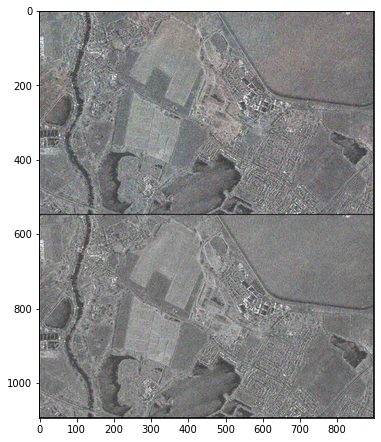

Iteration 02901    Loss 0.008776   PSNR_noisy: 20.567195   PSRN_gt: 24.273231 PSNR_gt_sm: 25.721548Iteration 02902    Loss 0.008760   PSNR_noisy: 20.574997   PSRN_gt: 24.151372 PSNR_gt_sm: 25.720426Iteration 02903    Loss 0.008750   PSNR_noisy: 20.579845   PSRN_gt: 24.237578 PSNR_gt_sm: 25.719983Iteration 02904    Loss 0.008724   PSNR_noisy: 20.592984   PSRN_gt: 24.243606 PSNR_gt_sm: 25.719361Iteration 02905    Loss 0.008677   PSNR_noisy: 20.616520   PSRN_gt: 24.351205 PSNR_gt_sm: 25.719160Iteration 02906    Loss 0.008714   PSNR_noisy: 20.597831   PSRN_gt: 24.122695 PSNR_gt_sm: 25.717554Iteration 02907    Loss 0.008693   PSNR_noisy: 20.608310   PSRN_gt: 24.250028 PSNR_gt_sm: 25.716843Iteration 02908    Loss 0.008680   PSNR_noisy: 20.614829   PSRN_gt: 24.279959 PSNR_gt_sm: 25.716200Iteration 02909    Loss 0.008661   PSNR_noisy: 20.624563   PSRN_gt: 24.217335 PSNR_gt_sm: 25.715005Iteration 02910    Loss 0.008658   PSNR_noisy: 20.625647   PSRN_gt: 24.313629 PSNR_gt_sm: 25.714413Iteration 

In [24]:
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [25]:
out_np = torch_to_np(net(net_input))

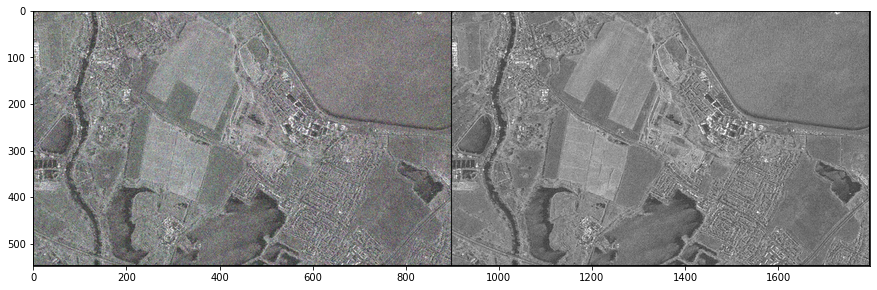

In [26]:
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);

#----------------------

In [27]:
(img_pil.size[1], img_pil.size[0])

(544, 896)

In [28]:
zero  = torch.zeros([1 ,32 ,544 ,896])
var=1./10

In [29]:
res = zero.normal_()*var
res<0

tensor([[[[False, False, False,  ...,  True, False,  True],
          [ True,  True,  True,  ...,  True, False, False],
          [ True,  True,  True,  ...,  True,  True, False],
          ...,
          [ True,  True,  True,  ..., False, False, False],
          [False,  True, False,  ...,  True, False,  True],
          [False,  True,  True,  ...,  True,  True,  True]],

         [[False, False,  True,  ..., False, False,  True],
          [ True,  True,  True,  ..., False, False,  True],
          [False,  True,  True,  ..., False, False, False],
          ...,
          [ True,  True, False,  ..., False, False, False],
          [ True,  True,  True,  ..., False,  True, False],
          [ True, False, False,  ...,  True,  True, False]],

         [[False, False,  True,  ...,  True,  True,  True],
          [ True,  True,  True,  ...,  True, False,  True],
          [False,  True, False,  ...,  True, False,  True],
          ...,
          [False,  True,  True,  ...,  True, False,

In [30]:
img_noisy_np.shape

(3, 544, 896)

In [31]:
torch.zeros([4,2,3])

tensor([[[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]],

        [[0., 0., 0.],
         [0., 0., 0.]]])

In [32]:
loc, scale = 0., 1.
s = np.random.laplace(loc, scale, [2,5,8])

In [33]:
# np_to_torch(s).shape
torch.from_numpy(s).shape

torch.Size([2, 5, 8])